### Glacier Runoff Analysis

Siling Lake in the Himalayas

ECE471 Remote Sensing Final Project

The Cooper Union

Spring 2021

Ernesto C., Chanoch G., David L.

Reference: https://earth.google.com/web/@31.80577794,89.195054,4543a,153438d,35y,-52h,46t,0r/data=CjQSMhIgM2ZkOTk3YWI0Njk4MTFlYTlkZWUyZGUyNWIyYWZmNjkiDmdsYWNpYWwtcnVub2Zm

In [1]:
import ee
import geemap
import numpy as np
import matplotlib.pyplot as plt
import os
import skimage
import skimage.filters
from skimage import io
import json
import pandas as pd
from tabulate import tabulate
from pprint import pprint
from matplotlib.colors import ListedColormap
import pathlib
import matplotlib.ticker as mtick
from collections import OrderedDict

In [2]:
# Trigger the authentication flow
ee.Authenticate()

# Initialize the library
ee.Initialize()

Enter verification code: 4/1AY0e-g55p9Fkj8WvClxelTCz2gkxeNelQh8IWEotsH7gu2rpPT3zu6yk4AI

Successfully saved authorization token.


### Create a map and add the GLIMS layer on top to visualize glaciers

Link to GLIMS dataset: https://developers.google.com/earth-engine/datasets/catalog/GLIMS_current

The following map is for visualization purposes only. It helps us visualize glaciers around the world using the GLIMS dataset.

We will be analyzing the ROI shown in the map below correspoinding to the Columbia Glacier in Alaska.

In [3]:
# Load geojson file with region of interest
#columbia_glacier_file = 'columbia_glacier_roi.geojson'
siling_lake = 'himalayas.geojson'

with open(siling_lake, 'r') as f:
  fc = json.load(f)

# grab the WGS geometry
geometry = fc['features'][0]['geometry']

# Create region of interest
lake_roi = ee.Geometry(geometry)

pprint(geometry)

{'coordinates': [[[88.470919, 31.317592],
                  [88.470919, 32.16934],
                  [89.436018, 32.16934],
                  [89.436018, 31.317592],
                  [88.470919, 31.317592]]],
 'type': 'Polygon'}


In [4]:
# Create map object
Map = geemap.Map()

dataset = ee.FeatureCollection('GLIMS/current')
visParams = {
  'palette': ['gray', 'cyan', 'blue'],
  'min': 0.0,
  'max': 10.0,
  'opacity': 0.8,
}

image = ee.Image().float().paint(dataset, 'area')

# Siling Lake coordinates to center map
lat = 31.93919649
lon = 89.0527558

Map.setCenter(lon, lat, 9)
Map.addLayer(image, visParams, 'GLIMS/current')
Map.addLayer(dataset, {}, 'for Inspector', False)
Map.add_ee_layer(lake_roi)

# Display map
Map

Map(center=[31.93919649, 89.0527558], controls=(WidgetControl(options=['position'], widget=HBox(children=(Togg…

### Create RGB timelapse

**Note: The following cells will dowload a GIF with a landsat timelapse of the Columbia Glacier. The GIF file will be automatically saved to the Downloads folder.**

In [5]:
# Create a new map for our timelapse
rgb_timelapse_map = geemap.Map()
rgb_timelapse_map.setCenter(lon, lat, 7)
rgb_timelapse_map

Map(center=[31.93919649, 89.0527558], controls=(WidgetControl(options=['position'], widget=HBox(children=(Togg…

In [10]:
# Add timelapse from 2000 to 2020
label = 'Glacier Runoff'
rgb_timelapse_map.add_landsat_ts_gif(roi=lake_roi,
                                label=label,
                                start_year=1988,
                                end_year=2020,
                                start_date='05-01',
                                end_date='10-31',
                                bands=['Red', 'Green', 'Blue'],
                                font_color='red',
                                frames_per_second=0.5,
                                progress_bar_color='blue',
                                download=False
                                )

Generating URL...
Please wait ...
The GIF image has been saved to: C:\Users\ernes\Downloads\landsat_ts_vdd.gif
Adding animated text to GIF ...
Adding GIF to the map ...
The timelapse has been added to the map.


### Create an RGB median composite from Landsat 7 and Landsat 8 imagery

In our analysis, we study the dynamics of the Columbia glacier over a a two-decade span (2000 - 2020). Thus, we need to overlap both Landsat 7 and Landsat 8 imagery.

References: 

USGS Landsat 8 Surface Reflectance Tier 1 - Google Earth Engine

https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C01_T1_SR#description

USGS Landsat 7 Surface Reflectance Tier 1 - Google Earth Engine

https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LE07_C01_T1_SR

**The sample RGB median composite shown below is from Landsat 8, year: 2016**

In [6]:
# cloud mask function for Landat 8
def maskL8sr(image):
  # Bits 3 and 5 are cloud shadow and cloud, respectively.
  cloudShadowBitMask = (1 << 3)
  cloudsBitMask = (1 << 5)
  # Get the pixel QA band.
  qa = image.select('pixel_qa')
  # Both flags should be set to zero, indicating clear conditions.
  mask = qa.bitwiseAnd(cloudShadowBitMask).eq(0) \
                 .And(qa.bitwiseAnd(cloudsBitMask).eq(0))
  return image.updateMask(mask)

start_date = '2016-01-01'
end_date = '2016-12-31'

dataset = ee.ImageCollection('LANDSAT/LC08/C01/T1_SR').filterDate(start_date, end_date).filterBounds(lake_roi).map(maskL8sr)

visParams = {
  'bands': ['B4', 'B3', 'B2'],
  'min': 0,
  'max': 6000,
  'gamma': 1.8,
}

Map_2016 = geemap.Map(center=(lat, lon), zoom=9)
Map_2016.addLayer(dataset.median(), visParams)
Map_2016

Map(center=[31.93919649, 89.0527558], controls=(WidgetControl(options=['position'], widget=HBox(children=(Togg…

### Downloading RGB Composites to Disk (Landsat 5, 7, and 8)

Uncomment the cells shown below to download the tiff files to disk. 

In [7]:
# Landsat 7 cloud mask function - Reference: Google Earth Engine documentation
def cloudMaskL457(image):
  qa = image.select('pixel_qa')
  # If the cloud bit (5) is set and the cloud confidence (7) is high
  # or the cloud shadow bit is set (3), then it's a bad pixel.
  cloud = qa.bitwiseAnd(1 << 5) \
                  .And(qa.bitwiseAnd(1 << 7)) \
                  .Or(qa.bitwiseAnd(1 << 3))
  # Remove edge pixels that don't occur in all bands
  mask2 = image.mask().reduce(ee.Reducer.min())
  return image.updateMask(cloud.Not()).updateMask(mask2)

In [8]:
def normalize_zero_one(img):
    """
    Function to normalize intensity values between [0,1]
    @param img: ndarray-like image
    @return: ndarray-like image normalized between 0 and 1
    """
    # convert image to float
    img = skimage.img_as_float(img)

    # normalize
    img_normalized = (img - img.min()) / (img.max() - img.min())

    return img_normalized

def rescale_by_percentile(img, bottom = 2, top=98):
    # Compute min and max percentile values from image
    vmin, vmax = np.percentile(img, (bottom, top))

    # Use scikit-image to rescale the intensity
    img_rscld = skimage.exposure.rescale_intensity(img, in_range=(vmin, vmax))

    return img_rscld

def rgb_plot(rgb_img):
    return skimage.exposure.equalize_hist(skimage.img_as_float(rgb_img))

In [9]:
# Define start and end date lists to create composites
yrs_in_btwn = 2020 - 1988 + 1

years = [str(1988 + i) for i in range(yrs_in_btwn)]

start_dates = [str(1988 + i) + '-05-01' for i in range(yrs_in_btwn)]

end_dates = [str(1988 + i) + '-10-31' for i in range(yrs_in_btwn)]

In [10]:
print(years)

['1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020']


**Uncomment the following cell to download the rasters to disk - only run once**

In [11]:
'''
# Create directories to save rasters
import pathlib
pathlib.Path('composites/himalayas/rgb').mkdir(parents=True, exist_ok=True)
#pathlib.Path('composites/himalayas/false_color').mkdir(parents=True, exist_ok=True)

rgb_path = 'composites/himalayas/rgb/'
#false_color_path = 'composites/himalayas/false_color'

# Now loop throgh each year and store the RGB and SWIR, NIR, Green rasters

for idx in range(len(start_dates)):
    
    yr = start_dates[idx].split('-')[0]
    print('current year: ', yr)
    if int(yr) < 1999:
        yrly_dataset = ee.ImageCollection('LANDSAT/LT05/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)
        
        # compute median composite
        yrly_rgb_median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select(['B3_median', 'B2_median', 'B1_median'])
        #yrly_false_col_median = yrly_dataset.reduce(ee.Reducer.median()).select(['B5_median', 'B4_median', 'B3_median'])
        
    elif int(yr) <= 2012 and int(yr) >= 1999:
    # filter dataset by dates
    
        yrly_dataset = ee.ImageCollection('LANDSAT/LE07/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)
        
        # compute median composite
        #median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select('B4_median', 'B5_median')
        
        # compute median composite
        yrly_rgb_median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select(['B3_median', 'B2_median', 'B1_median'])
        #yrly_false_col_median = yrly_dataset.reduce(ee.Reducer.median()).select(['B5_median', 'B4_median', 'B3_median'])
            
    else:
        yrly_dataset = ee.ImageCollection('LANDSAT/LC08/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(maskL8sr)
    
        # compute median composite
        #median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select('B5_median', 'B6_median')
        
        # compute median composite
        yrly_rgb_median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select(['B4_median', 'B3_median', 'B2_median'])
        #yrly_false_col_median = yrly_dataset.reduce(ee.Reducer.median()).select(['B6_median', 'B5_median', 'B3_median'])

    
    # clip median composite to roi bounds
    median_comp_rgb_img = yrly_rgb_median_comp.clip(lake_roi).unmask()
    #median_comp_false_col_img = yrly_false_col_median.clip(roi).unmask()
    
    # export image
    geemap.ee_export_image(median_comp_rgb_img, filename=rgb_path + 'siling_rgb_median_'+ years[idx] +'.tif', crs='EPSG:32645', scale=100, region=lake_roi, file_per_band=False)
    #geemap.ee_export_image(median_comp_false_col_img, filename=false_color_path + 'false_color_median_'+ years[idx] +'.tif', crs='EPSG:32645', scale=100, region=roi, file_per_band=False)
            
print('done')
'''

"\n# Create directories to save rasters\nimport pathlib\npathlib.Path('composites/himalayas/rgb').mkdir(parents=True, exist_ok=True)\n#pathlib.Path('composites/himalayas/false_color').mkdir(parents=True, exist_ok=True)\n\nrgb_path = 'composites/himalayas/rgb/'\n#false_color_path = 'composites/himalayas/false_color'\n\n# Now loop throgh each year and store the RGB and SWIR, NIR, Green rasters\n\nfor idx in range(len(start_dates)):\n    \n    yr = start_dates[idx].split('-')[0]\n    print('current year: ', yr)\n    if int(yr) < 1999:\n        yrly_dataset = ee.ImageCollection('LANDSAT/LT05/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)\n        \n        # compute median composite\n        yrly_rgb_median_comp =  yrly_dataset.reduce(ee.Reducer.median()).select(['B3_median', 'B2_median', 'B1_median'])\n        #yrly_false_col_median = yrly_dataset.reduce(ee.Reducer.median()).select(['B5_median', 'B4_median', 'B3_median'])\n        \n    elif int(yr) <= 2012 an

### NDWI

I can compute water statistics directly on the NDWI dataset if I clip to my region of interest. Alternatively, I can compute NDSI manually myself and use numpy

In [12]:
strt_date = '1988-05-01'
end_date = '1988-10-31'

ndwi_dataset = ee.ImageCollection('LANDSAT/LT05/C01/T1_8DAY_NDWI').filterDate(strt_date, end_date)
colorized = ndwi_dataset.select('NDWI')
colorizedVis = {
  min: 0.0,
  max: 1.0,
  'palette': ['F7FBFF','FEE391','2171B5','08306B'],
}


Map = geemap.Map(center=(lat, lon), zoom=10)
Map.addLayer(colorized, colorizedVis, 'Colorized');
Map

Map(center=[31.93919649, 89.0527558], controls=(WidgetControl(options=['position'], widget=HBox(children=(Togg…

### Download the NDWI rasters

### I am going to compute NDWI manually

https://www.linkedin.com/pulse/ndvi-ndbi-ndwi-calculation-using-landsat-7-8-tek-bahadur-kshetri/

In [13]:
'''
# Create directories to save rasters

pathlib.Path('composites/himalayas/ndwi').mkdir(parents=True, exist_ok=True)

ndwi_path = 'composites/himalayas/ndwi/'

# Now loop throgh each year and store the NDWI Rasters

for idx in range(len(start_dates)):
    
    yr = start_dates[idx].split('-')[0]
    print('current year: ', yr)
    if int(yr) < 1999:
        # Landsat 5
        dataset = ee.ImageCollection('LANDSAT/LT05/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)
        
        # compute median composite
        median_comp =  dataset.reduce(ee.Reducer.median())
        
        # compute ndwi ratio
        ndwi = median_comp.select('B2_median').subtract(median_comp.select('B5_median')).divide(median_comp.select('B2_median').add(median_comp.select('B5_median')))
        
    elif int(yr) <= 2012 and int(yr) >= 1999:
        
        # Landsat 7
        # filter dataset by dates
        dataset = ee.ImageCollection('LANDSAT/LE07/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)
        
        # compute median composite
        median_comp =  dataset.reduce(ee.Reducer.median())
        
        # compute ndwi ratio
        ndwi = median_comp.select('B2_median').subtract(median_comp.select('B5_median')).divide(median_comp.select('B2_median').add(median_comp.select('B5_median')))
        
            
    else:
        # Landsat 8
        dataset = ee.ImageCollection('LANDSAT/LC08/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(maskL8sr)
        
        # compute median composite
        median_comp =  dataset.reduce(ee.Reducer.median())
        
        # compute ndwi ratio
        ndwi = median_comp.select('B3_median').subtract(median_comp.select('B6_median')).divide(median_comp.select('B3_median').add(median_comp.select('B6_median')))
    
       
    # clip median composite to roi bounds
    composite = ndwi.clip(roi)
        
    # export image
    geemap.ee_export_image(composite, filename=ndwi_path + 'himalayas_ndwi_'+ years[idx] +'.tif', crs='EPSG:32645', scale=100, region=roi, file_per_band=False)
            
print('done')
'''

"\n# Create directories to save rasters\n\npathlib.Path('composites/himalayas/ndwi').mkdir(parents=True, exist_ok=True)\n\nndwi_path = 'composites/himalayas/ndwi/'\n\n# Now loop throgh each year and store the NDWI Rasters\n\nfor idx in range(len(start_dates)):\n    \n    yr = start_dates[idx].split('-')[0]\n    print('current year: ', yr)\n    if int(yr) < 1999:\n        # Landsat 5\n        dataset = ee.ImageCollection('LANDSAT/LT05/C01/T1_SR').filterDate(start_dates[idx], end_dates[idx]).map(cloudMaskL457)\n        \n        # compute median composite\n        median_comp =  dataset.reduce(ee.Reducer.median())\n        \n        # compute ndwi ratio\n        ndwi = median_comp.select('B2_median').subtract(median_comp.select('B5_median')).divide(median_comp.select('B2_median').add(median_comp.select('B5_median')))\n        \n    elif int(yr) <= 2012 and int(yr) >= 1999:\n        \n        # Landsat 7\n        # filter dataset by dates\n        dataset = ee.ImageCollection('LANDSAT/LE0

### Loading the NDWI rasters saved to disk

In [18]:
import matplotlib.colors

# create custom ndwi colormap
#ndwi_hex_cmap = ['#F7FBFF','#FEE391','#2171B5','#08306B']
ndwi_hex_cmap = ['#F7FBFF','#FFFFE5','#2171B5','#08306B']

# convert hex to rgb
ndwi_colors = [matplotlib.colors.to_rgb(i) for i in ndwi_hex_cmap]

# create cmap object
ndwi_cmap = ListedColormap(ndwi_colors)

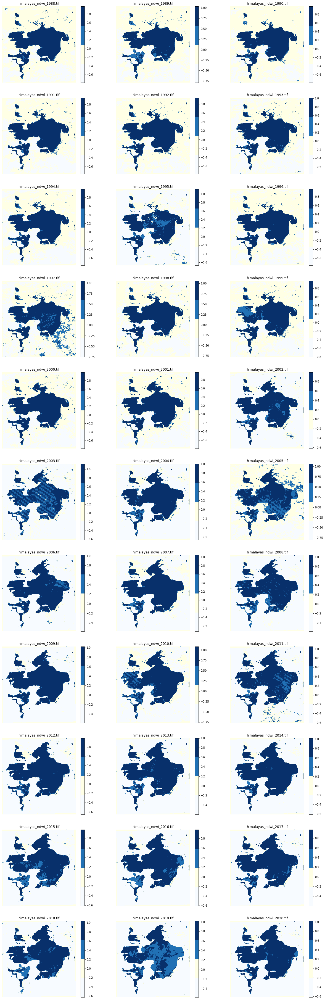

In [19]:
ndwi_fn = sorted(os.listdir('composites/himalayas/ndwi'))
ndwi_path = 'composites/himalayas/ndwi/'

fig, ax = plt.subplots(len(ndwi_fn) // 3, 3, figsize=(21, 66))
ax = ax.ravel()

ndwi_stack = list()

# load all the composites
for idx in range(len(ndwi_fn)):
    
    img = skimage.img_as_float(io.imread(ndwi_path + ndwi_fn[idx]))
    ndwi_stack.append(img)
    
    ratio = ax[idx].imshow(img, cmap=ndwi_cmap)
    ax[idx].set_title(ndwi_fn[idx])
    ax[idx].axis('off')
    fig.colorbar(ratio, ax=ax[idx])

#fig.delaxes(ax[-1])

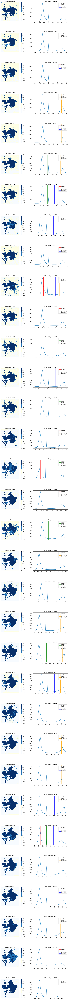

In [34]:
# plot distribution of ndwi values

# compute histograms
# Compute and plot histograms for a sanity check to aid in developing an appropriate thresholding algorithm
num_col = 2
fig, ax = plt.subplots(len(ndwi_stack), num_col, figsize=(15, 200))
ax = ax.ravel()

thresh = 0.5
pct = 80

#years = [str(2000 + i) for i in range(21)]

ndwi_masks = list()

for i, img in enumerate(ndwi_stack):
    
    # compute histogram
    hist, ctrs = np.histogram(img, bins=100)

    # compute median
    ratio_median = np.median(img.flatten())

    # compute mean
    ratio_mean = np.mean(img.flatten())

    # compute chosen percentile
    pctile = np.percentile(img.flatten(), pct)

    # plot ratio and histogram
    ratio = ax[num_col*i].imshow(img, cmap=ndwi_cmap)
    ax[num_col*i].set_title('NDWI Ratio, ' + years[i])
    ax[num_col*i].axis('off')
    fig.colorbar(ratio, ax=ax[num_col*i])
    
    # plot histogram
    ax[num_col*i + 1].plot(ctrs[1:], hist)
    ax[num_col*i + 1].set_title('NDWI Histogram, ' + years[i])
    
    # plot median line
    ax[num_col*i + 1].axvline(x=ratio_median, ymin=0, ymax=np.max(hist), c='r', label='median')

    # plot mean line
    ax[num_col*i + 1].axvline(x=ratio_mean, ymin=0, ymax=np.max(hist), c='g', label='mean')

    # plot percentile line
    ax[num_col*i + 1].axvline(x=pctile, ymin=0, ymax=np.max(hist), c='orange', label=str(pct) + '%% pctile')

    # compute threshold using Otsu's multi-threshold
    multi_otsu = skimage.filters.threshold_multiotsu(img, classes=3)
    thresh = multi_otsu[-1]
    
    mask = img > thresh

    # store ice masks
    ndwi_masks.append(mask)

    # plot Otsu's threshold
    ax[num_col*i + 1].axvline(x=thresh, ymin=0, ymax=np.max(hist), c='b', label='threshold')
    ax[num_col*i + 1].legend()

    # plot mask
    #ax[num_col*i + 2].imshow(mask, cmap=ndwi_cmap)
    #ax[num_col*i + 2].set_title('Ice Mask, ' + years[i])
    #ax[num_col*i + 2].axis('off')

fig.subplots_adjust(hspace=0.6)

### Compute Glacial Runoff Statistics

In [108]:
# Compute percent ice pixels per year --> % of total ROI area
yrly_pct_water = OrderedDict()

for yr, m in zip(years, ndwi_masks):
    # compute % ice
    pct_water = np.sum(m) / m.size

    # store percent glacier - unitless
    yrly_pct_water[str(yr)] = pct_water
    
# compute percent delta between 1988 and each subsequent year as the arithmetic difference
yrly_delta_from_1988 = (np.array(list(yrly_pct_water.values())) - yrly_pct_water['1988']) * 100

print(yrly_delta_from_1988)

[ 0.         -0.56944157 -0.54604444  0.82458169  0.79093439  0.74558853
  0.46671703 -0.12244498  0.01459535  0.42337663  0.67194328  1.02936228
  2.12278814  2.90514358  3.61418802  0.17726111  4.68154278  3.931052
  6.09272394  5.81853186  5.41275879  6.89769661  6.35744575  8.2516105
  7.66411972  7.54122908  7.60161596  7.42390919  7.06080803  7.58033572
  7.36853599  8.06889006  8.29093996]


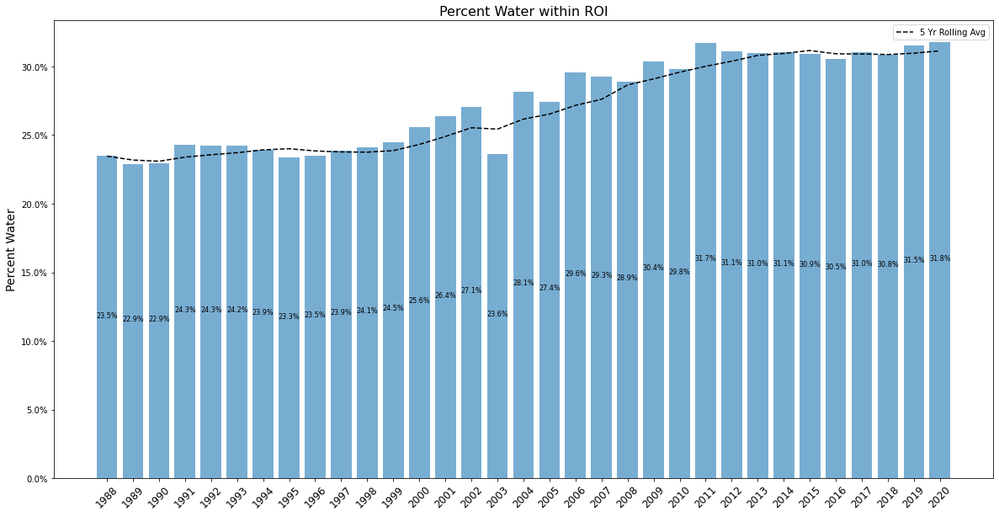

In [38]:
wtr_rolling_avg = pd.DataFrame(list(yrly_pct_water.values())).rolling(window=5,min_periods=1).mean().to_numpy()

# plot percent ice per year
fig_pct_wtr, ax_pct_wtr = plt.subplots(1, 1, figsize=(20, 10))

years_int = [int(year) for year in years]

ax_pct_wtr.bar(years_int, list(yrly_pct_water.values()), alpha=0.6)

ax_pct_wtr.plot(years_int, wtr_rolling_avg, 'k--', label='5 Yr Rolling Avg')

ax_pct_wtr.set_xticks(years_int)
ax_pct_wtr.set_xticklabels(years, rotation=45, fontsize=12);

ax_pct_wtr.set_ylabel("Percent Water", fontsize=14)
ax_pct_wtr.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax_pct_wtr.set_title("Percent Water within ROI", fontsize=16)

ax_pct_wtr.legend()

#https://stackoverflow.com/questions/52080991/display-percentage-above-bar-chart-in-matplotlib

for patch in ax_pct_wtr.patches:
    width = patch.get_width()
    height = patch.get_height()
    x, y = patch.get_xy()
    ax_pct_wtr.annotate("%0.1f%%" % (height * 100), (x + width/2, y + (height / 2)  ), ha='center', size=8)

In [39]:
# compute extent properties
height = ndwi_masks[0].shape[0]
width = ndwi_masks[0].shape[1]
surf_area_km_sq = ndwi_masks[0].size * (100**2)

print("height pix: {0}, width pix: {1}, area: {2}".format(height, width, surf_area_km_sq))

# how many kilometers are in each direction?
km_x_dir = (width * 100) / 1000
km_y_dir = (height * 100) / 1000
print("km in x: {0}, km in y: {1}".format(km_x_dir, km_y_dir))

height pix: 962, width pix: 933, area: 8975460000
km in x: 93.3, km in y: 96.2


### Computing mean LST for Himalayas Lake

https://developers.google.com/earth-engine/datasets/catalog/MODIS_006_MOD11A1

In [40]:
lst_dataset = ee.ImageCollection('MODIS/006/MOD11A1').filter(ee.Filter.date('2018-01-01', '2018-05-31'))

lst = lst_dataset.select('LST_Day_1km')

lst_vis = {
  'min': 13000.0,
  'max': 16500.0,
  'palette': [
    '040274', '040281', '0502a3', '0502b8', '0502ce', '0502e6',
    '0602ff', '235cb1', '307ef3', '269db1', '30c8e2', '32d3ef',
    '3be285', '3ff38f', '86e26f', '3ae237', 'b5e22e', 'd6e21f',
    'fff705', 'ffd611', 'ffb613', 'ff8b13', 'ff6e08', 'ff500d',
    'ff0000', 'de0101', 'c21301', 'a71001', '911003'
  ],
}

lst_map = geemap.Map(center=(lat, lon), zoom=9)
lst_map.addLayer(lst, lst_vis, 'Land Surface Temperature')
lst_map

Map(center=[31.93919649, 89.0527558], controls=(WidgetControl(options=['position'], widget=HBox(children=(Togg…

In [41]:
# Scale to Kelvin and convert to Celsius, set image acquisition time.
def lst_kelvin_to_c(temp_k):
    return (temp_k * 0.02) - 273.15

In [42]:
# Now repeat for entire time period, 2000 throuh 2020
# the dataset we're using dates back to 2000-03-05, so let's start in April

#https://stackoverflow.com/questions/34898525/generate-list-of-months-between-interval-in-python/42857552

# create date ranges
dates = pd.date_range('2000-04-01','2021-01-01', freq='MS').strftime("%Y-%m-%d").tolist()
#print(dates)

months = pd.date_range('2000-04-01','2021-01-01', freq='MS').strftime("%Y-%b").tolist()

#print('\n', months)

In [25]:
# Initialize dict to store the mean temperature and salinity
lst_temp_monthly = OrderedDict()

lst_band = 'LST_Day_1km'

# cycle through the dataset and compute a mean and median
for idx, dt in enumerate(dates):
    #print("current time period: ", months[idx])
    
    # create daterange object
    date_start = ee.Date(dt)
    date_range = ee.DateRange(date_start, date_start.advance(1, 'month'))
    
    # grab dataset
    #dataset = ee.ImageCollection('HYCOM/sea_temp_salinity').filter(ee.Filter.date(start_dates[idx], end_dates[idx])).map(scaleAndOffset)
    
    lst_dataset = ee.ImageCollection('MODIS/006/MOD11A1').filterDate(date_range)

    lst = lst_dataset.select('LST_Day_1km')
    
    # compute mean land surface temperature
    #lst_mean = lst.mean()
    
    lst_mean_temp = lst.mean().reduceRegion(reducer=ee.Reducer.mean(),
                                            geometry=lake_roi,
                                            scale=1000,
                                            bestEffort=True)
    
    
    # convert to celsius
    temp_celsius = lst_kelvin_to_c(lst_mean_temp.get('LST_Day_1km').getInfo())
    
    # store mean land surface temperature
    lst_temp_monthly[months[idx]] = [temp_celsius]

print('done')

In [26]:
lst_mthly_df = pd.DataFrame.from_dict(lst_temp_monthly, orient='index', columns=['Mean LST Temp (C)'])
lst_mthly_df.head(10)

,Mean LST Temp (C)
2000-Apr,15.696575
2000-May,23.849715
2000-Jun,25.250167
2000-Jul,20.016857
2000-Aug,17.795398
2000-Sep,15.927500
2000-Oct,16.985999
2000-Nov,8.496900
2000-Dec,3.421709
2001-Jan,1.465397


In [27]:
# compute rolling average to see the trend
lst_rolling_avg_qtr = lst_mthly_df.rolling(window=3,min_periods=1).mean()
lst_rolling_avg_qtr.columns = ['Quaterly Mean LST (C)']
lst_rolling_avg_qtr.head(5)

,Quaterly Mean LST (C)
2000-Apr,15.696575
2000-May,19.773145
2000-Jun,21.598819
2000-Jul,23.038913
2000-Aug,21.020807


<AxesSubplot:>

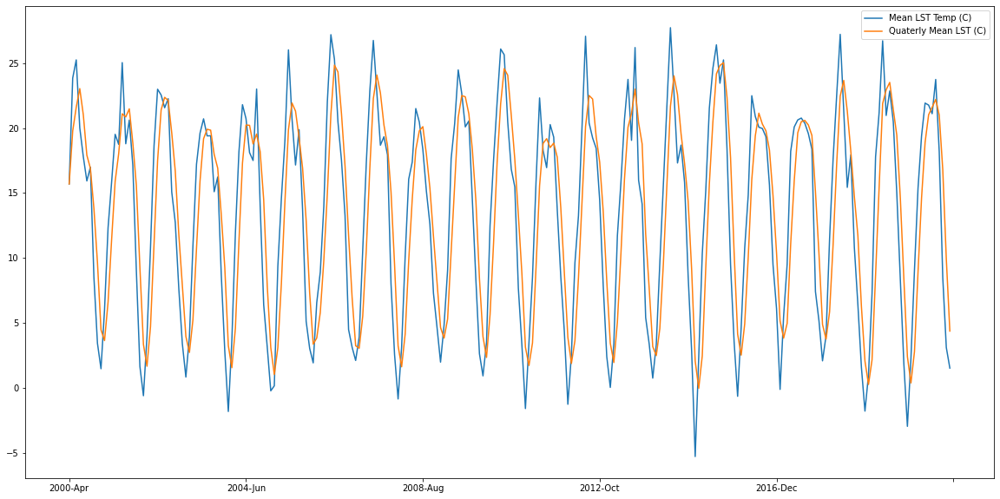

In [28]:
fig, axes = plt.subplots(1,1, figsize=(20, 10))

lst_mthly_df.plot(ax=axes, label='Monthly Avg')
lst_rolling_avg_qtr.plot(ax=axes, label='Quaterly Avg')

### Extract Lake Outline

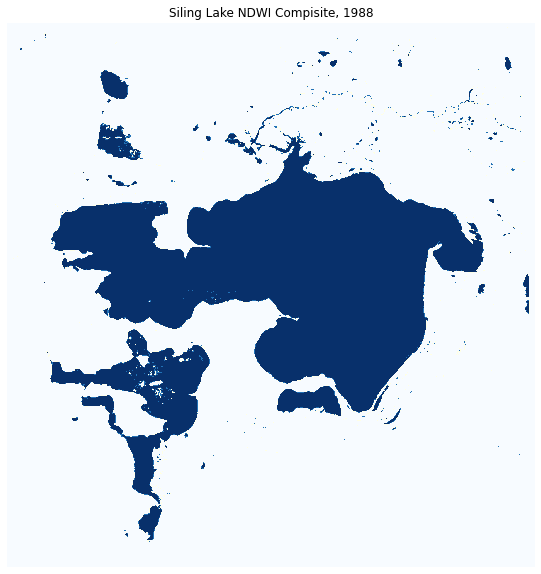

In [43]:
# grab benchmark ndwi mask
benchmark_ndwi = ndwi_masks[0]

plt.figure(figsize=(10, 10))
plt.imshow(benchmark_ndwi, cmap=ndwi_cmap)
plt.title('Siling Lake NDWI Compisite, 1988')
plt.axis('off');

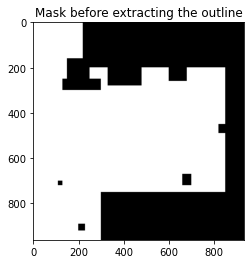

In [44]:
from skimage import morphology
# extract boundary 
# first erode to eliminate spurious
# let me create a mask first so I only erode the top part of the image
spur_mask = np.ones(benchmark_ndwi.shape)
spur_mask[0:200, 220:] = 0
spur_mask[:, 850:] = 0
spur_mask[750:, 300:] = 0
spur_mask[200:280, 330:480] = 0
spur_mask[250:300, 130:300] = 0
spur_mask[670:720, 660:700] = 0
spur_mask[200:260, 600:680] = 0
spur_mask[700:720, 110:130] = 0
spur_mask[890:920, 200:230] = 0
spur_mask[450:490, 820:850] = 0
spur_mask[160:250, 150:250] = 0

plt.imshow(spur_mask, cmap='gray');
plt.title("Mask before extracting the outline");


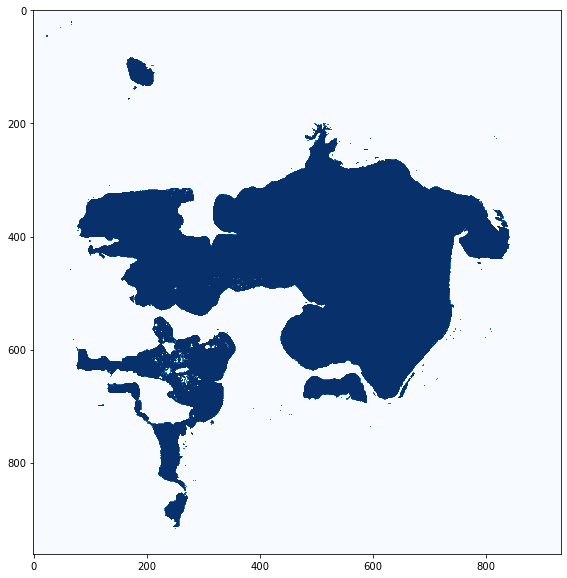

In [45]:
# erode top part
benchmark_cropped = benchmark_ndwi.copy() * spur_mask
plt.figure(figsize=(10, 10))
plt.imshow(benchmark_cropped, cmap=ndwi_cmap)

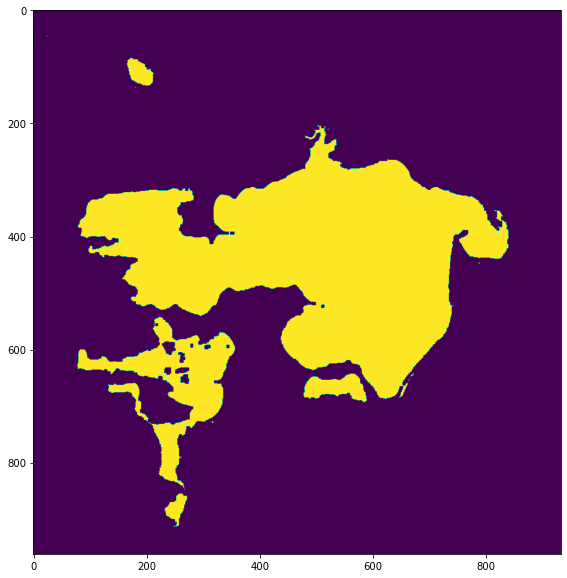

In [46]:
benchmark_morph = morphology.closing(morphology.binary_erosion(benchmark_cropped, selem=np.ones((3, 3))), selem=np.ones((5, 5)))
plt.figure(figsize=(10, 10))
plt.imshow(benchmark_morph)

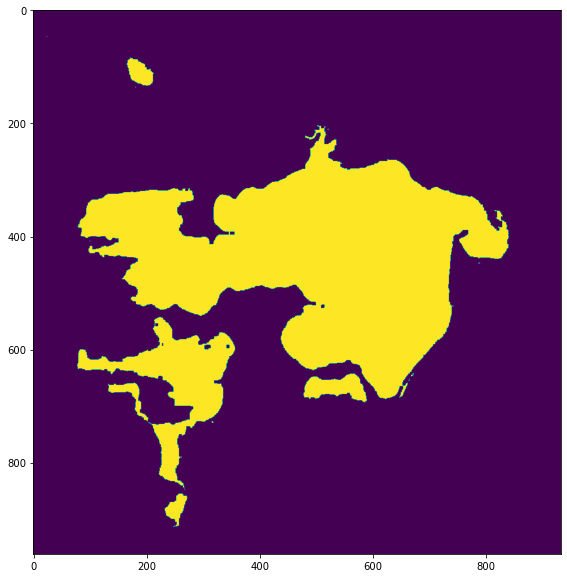

In [47]:
# more clean-up
benchmark_morph[585:650, 230:290] = 1
benchmark_morph[630:700, 250:290] = 1
plt.figure(figsize=(10, 10))
plt.imshow(benchmark_morph)

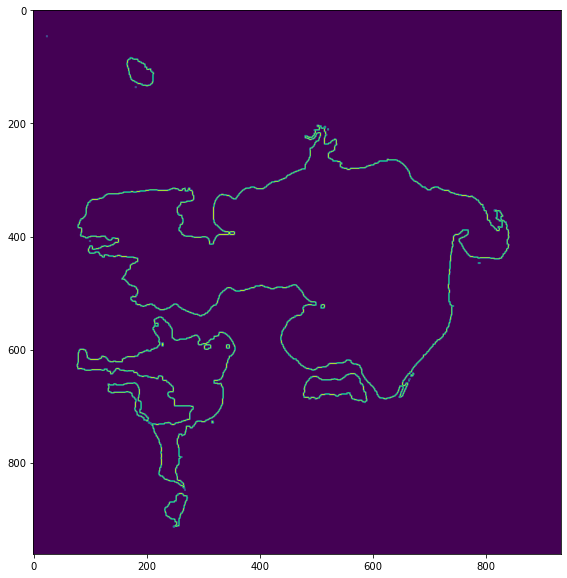

In [48]:
# edge detection
benchmark_prewitt = skimage.filters.prewitt(benchmark_morph)
plt.figure(figsize=(10, 10))
plt.imshow(benchmark_prewitt)

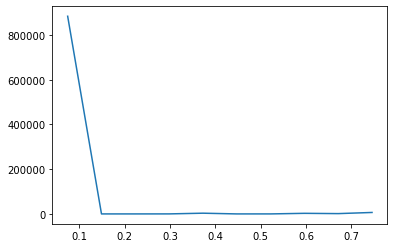

In [49]:
hist, ctrs = np.histogram(benchmark_prewitt)
plt.figure()
plt.plot(ctrs[1:], hist)

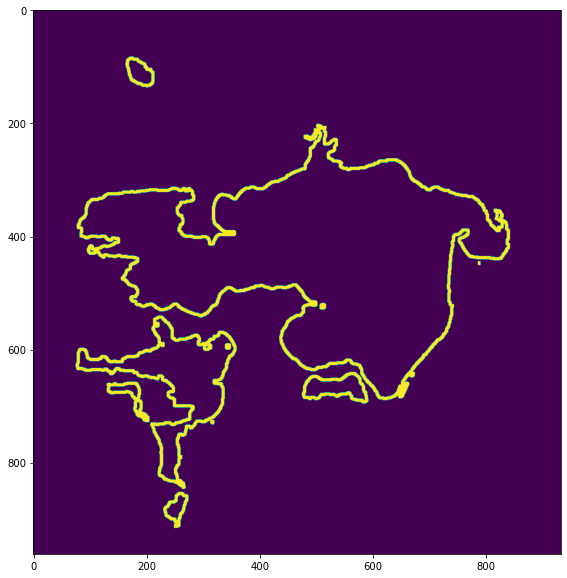

In [50]:
# dilate to make outline thicker

# binarize image
benchmark_prewitt = benchmark_prewitt > 0.6

# thicken outline
benchmark_prewitt = morphology.binary_dilation(benchmark_prewitt, selem=np.ones((5, 5)))
plt.figure(figsize=(10, 10))
plt.imshow(benchmark_prewitt)

In [51]:
def normalize_zero_one(img):
    """
    Function to normalize intensity values between [0,1]
    @param img: ndarray-like image
    @return: ndarray-like image normalized between 0 and 1
    """
    # convert image to float
    img = skimage.img_as_float(img)

    # normalize
    img_normalized = (img - img.min()) / (img.max() - img.min())

    return img_normalized

def rescale_by_percentile(img, bottom = 2, top=98):
    # Compute min and max percentile values from image
    vmin, vmax = np.percentile(img, (bottom, top))

    # Use scikit-image to rescale the intensity
    img_rscld = skimage.exposure.rescale_intensity(img, in_range=(vmin, vmax))

    return img_rscld

def rgb_plot(rgb_img):
    return skimage.exposure.equalize_hist(skimage.img_as_float(rgb_img))

C:\Users\ernes\anaconda3\envs\remote-sensing\lib\site-packages\skimage\exposure\exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


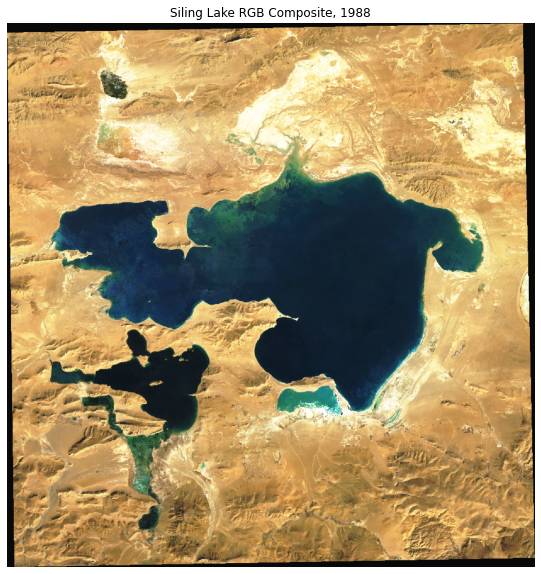

In [52]:
# load the corresponding 1988 raster
raster = skimage.img_as_float(io.imread('composites/himalayas/rgb/rgb_median_1988.tif'))
raster = rgb_plot(raster)

plt.figure(figsize=(10, 10))
plt.imshow(raster);
plt.title('Siling Lake RGB Composite, 1988')
plt.axis("off");

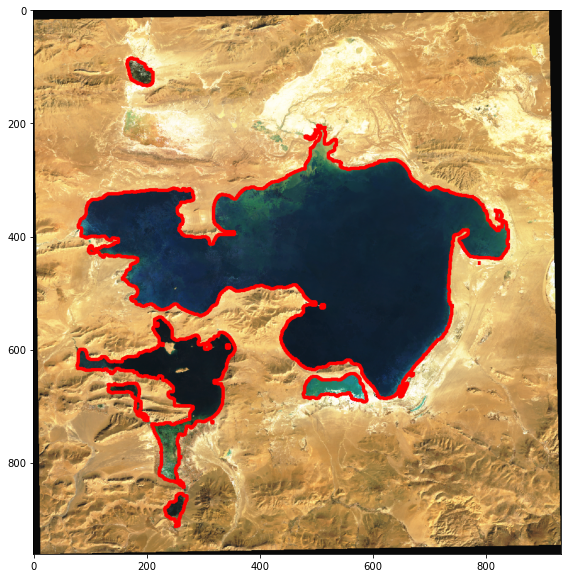

In [53]:
# superimpose outline with RGB raster
red = raster[:, :, 0]
red[benchmark_prewitt] = 1.0

green = raster[:, :, 1]
green[benchmark_prewitt] = 0

blue = raster[:, :, 2]
blue[benchmark_prewitt] = 0

raster_w_bdry = np.dstack([red, green, blue])

plt.figure(figsize=(10, 10))
plt.imshow(raster_w_bdry)

In [54]:
# load all the rgb rasters
rgb_path = 'composites/himalayas/rgb_2/'
siling_rgb_fn = sorted(os.listdir(rgb_path))
rgb_list = [rgb_plot(skimage.img_as_float(io.imread(rgb_path + fn))) for fn in siling_rgb_fn]

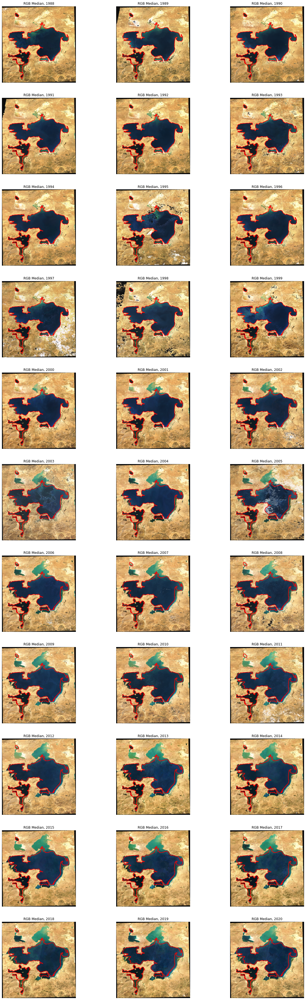

In [55]:
rgb_with_outline = list()

num_col = 3

outline_fig, outline_ax = plt.subplots(len(siling_rgb_fn) // 3, num_col, figsize=(21, 66))
outline_ax = outline_ax.ravel()

i = 0

for i, rgb in enumerate(rgb_list):
        
    # pluck red, green, and blue channels individually
    red = rgb[:, :, 0]
    red[benchmark_prewitt] = 1.0

    green = rgb[:, :, 1]
    green[benchmark_prewitt] = 0

    blue = rgb[:, :, 2]
    blue[benchmark_prewitt] = 0

    raster_w_bdry = np.dstack([red, green, blue])
    
    # store
    rgb_with_outline.append(raster_w_bdry)
    
    # plot
    # rgb
    outline_ax[i].imshow(raster_w_bdry)
    outline_ax[i].set_title('RGB Median, ' + years[i])
    outline_ax[i].axis('off')
    
    # false color
    #term_ax[num_col*i + 1].imshow(false_raster_w_bdry)
    #term_ax[num_col*i + 1].set_title('False Color Median, ' + years[i])
    #term_ax[num_col*i + 1].axis('off')


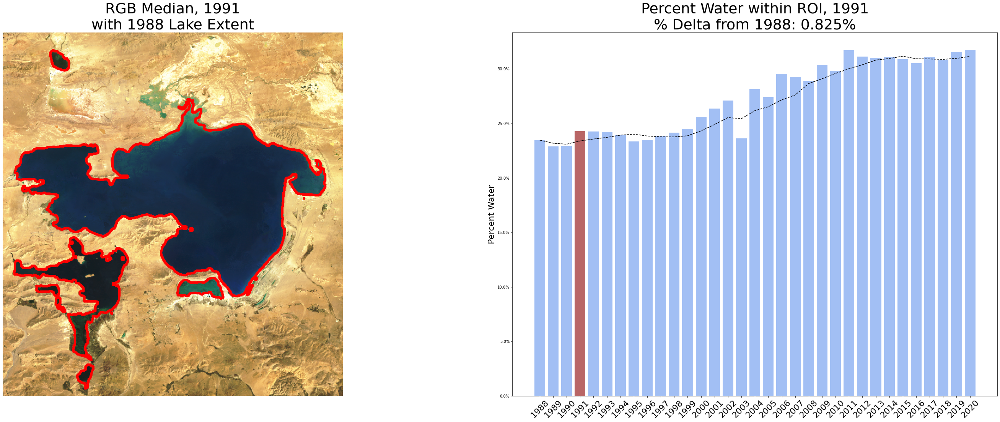

In [131]:
# Plot outlined raster next to bar chart... is that going to be too large?

fig, ax = plt.subplots(1, 2, figsize=(50, 17.5))
ax = ax.ravel()

idx = 3
#yr = 1988
yr = years[idx]

ax[0].axis('off')
ax[0].imshow(rgb_with_outline[idx][40:-30,50:-50])
ax[0].set_title('RGB Median, {0}\nwith 1988 Lake Extent'.format(yr), fontsize=38);

bar_colors = ['cornflowerblue' for i in range(len(years))]

# color current year differently
bar_colors[idx] = 'darkred'

ax[1].bar(years_int, list(yrly_pct_water.values()), color= bar_colors, alpha=0.6)

ax[1].plot(years_int, wtr_rolling_avg, 'k--', label='5 Yr Rolling Avg')

ax[1].set_xticks(years_int);
ax[1].set_xticklabels(years, rotation=45, fontsize=22);

ax[1].set_ylabel("Percent Water", fontsize=22);
ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
y_ticks = [0.0, 0.05, 0.10, 0.15]
#ax[1].set_yticks(y_ticks)
#ax[1].set_yticklabels(y_ticks, rotation=0, fontsize=22);

ax[1].set_title("Percent Water within ROI, {:}\n% Delta from 1988: {:1.3f}%".format(yr, yrly_delta_from_1988[idx]), fontsize=38);

In [132]:
outdir = 'composites/himalayas/animation/'

#fig, ax = plt.subplots(1, 2, figsize=(50, 17.5))
#ax = ax.ravel()

for idx in range(len(rgb_with_outline)):
    
    fig, ax = plt.subplots(1, 2, figsize=(50, 17.5))
    ax = ax.ravel()
    
    #idx = 3
    #yr = 1988
    yr = years[idx]

    ax[0].axis('off')
    ax[0].imshow(rgb_with_outline[idx][40:-30,50:-50])
    ax[0].set_title('RGB Median, {0}\nwith 1988 Lake Extent'.format(yr), fontsize=38);

    bar_colors = ['cornflowerblue' for i in range(len(years))]

    # color current year differently
    bar_colors[idx] = 'darkred'

    ax[1].bar(years_int, list(yrly_pct_water.values()), color= bar_colors, alpha=0.6)

    ax[1].plot(years_int, wtr_rolling_avg, 'k--', label='5 Yr Rolling Avg')

    ax[1].set_xticks(years_int);
    ax[1].set_xticklabels(years, rotation=45, fontsize=22);

    ax[1].set_ylabel("Percent Water", fontsize=22);
    ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    y_ticks = [0.0, 0.05, 0.10, 0.15]
    #ax[1].set_yticks(y_ticks)
    #ax[1].set_yticklabels(y_ticks, rotation=0, fontsize=22);

    ax[1].set_title("Percent Water within ROI, {:}\n% Delta from 1988: {:1.3f}%".format(yr, yrly_delta_from_1988[idx]), fontsize=38);
    
    fout = os.path.join(outdir, 'siling_frame_{0}.jpg'.format(idx+1))
    plt.savefig(fout, bbox_inches='tight')
    plt.close()

In [127]:
from glob import glob

# create timelapse animation
input_files = glob(os.path.join(outdir, '*.jpg'))

# sort the file names
def get_idx(fn):
    idx = int(fn.split('_')[-1].strip('.jpg'))
    return idx

input_files = sorted(input_files, key=get_idx)

In [128]:
print(input_files)

['composites/himalayas/animation\\siling_frame_1.jpg', 'composites/himalayas/animation\\siling_frame_2.jpg', 'composites/himalayas/animation\\siling_frame_3.jpg', 'composites/himalayas/animation\\siling_frame_4.jpg', 'composites/himalayas/animation\\siling_frame_5.jpg', 'composites/himalayas/animation\\siling_frame_6.jpg', 'composites/himalayas/animation\\siling_frame_7.jpg', 'composites/himalayas/animation\\siling_frame_8.jpg', 'composites/himalayas/animation\\siling_frame_9.jpg', 'composites/himalayas/animation\\siling_frame_10.jpg', 'composites/himalayas/animation\\siling_frame_11.jpg', 'composites/himalayas/animation\\siling_frame_12.jpg', 'composites/himalayas/animation\\siling_frame_13.jpg', 'composites/himalayas/animation\\siling_frame_14.jpg', 'composites/himalayas/animation\\siling_frame_15.jpg', 'composites/himalayas/animation\\siling_frame_16.jpg', 'composites/himalayas/animation\\siling_frame_17.jpg', 'composites/himalayas/animation\\siling_frame_18.jpg', 'composites/himala

In [129]:
# load all images
img_stack = [io.imread(f) for f in input_files]

In [130]:
import moviepy.editor as mpy
siling_output_gif = 'siling_glacial_runoff_animation.gif'
clip = mpy.ImageSequenceClip(img_stack, fps=1)
clip.write_gif(siling_output_gif, fps=1, program='ffmpeg')

t:   9%|██████▎                                                               | 3/33 [00:00<00:01, 28.85it/s, now=None]

MoviePy - Building file  siling_glacial_runoff_animation.gif
MoviePy - - Generating GIF frames.


MoviePy - - File ready: siling_glacial_runoff_animation.gif.
